<a href="https://colab.research.google.com/github/MittalNeha/AI-ML_classProjects/blob/master/Siamese_CompareFaces.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Advanced Certification in AIML
## A Program by IIIT-H and TalentSprint

The objective of this experiment is to understand Siamese Network.

Tons of data area available on the web (wikipedia, Google, Twitter, YouTube) that could be used to train an ML model.
One such source is Google Images. You enter a text query and Google Images shows thousands of related images based on the query and text that are present on the web page with the related image.

In this experiment we would crawl images from Google Images and try to use this as data for training.

1. Your task is to search for face images for 'AamairKhan', 'Rimisen', 'Kajol', 'KareenaKapoor','RishiKapoor', 'AmrishPuri', 'AnilKapoor', 'AnupamKher', 'BomanIrani', 'HrithikRoshan', 'KajalAgarwal', 'KatrinaKaif', 'Madhavan', 'MadhuriDixit', 'Umashri', 'Trisha'

2. Refine your search to faces (Google Images -> enter query -> Tools -> Type -> Face). You could also use movies', ads' names as additional query (e.g., "Aamir 3 idiots", "Boman Irani Khosla Ka Ghosla", "Katrina Slice ad" etc.). The results are noisy but they are useful, and moreover, they are avaible in abundance and for free!

    a. Example: https://www.google.co.in/search?client=firefox-b-ab&dcr=0&biw=1366&bih=628&tbs=itp%3Aface&tbm=isch&sa=1&ei=5gbIWtCjN4n2vgSCoqzYBw&q=biswa+kalyan+rath

3. Then use a browser extensions to download all the results into a directory. In this way you, would get around 300-600 images for each class. Overall, you should collect atleast 10000 images.
    
    a. Firefox: https://addons.mozilla.org/en-US/firefox/addon/google-images-downloader/
    
    b. Chrome: https://chrome.google.com/webstore/detail/download-all-images/ifipmflagepipjokmbdecpmjbibjnakm/related?hl=en
    
4. **Without cleaning** use these images as your training data. Test you results on IMFDB test set.



#### Run the Notebook on GPU

In [ ]:
Sequence Expressions

Anger, disgust, fear, happiness, neutral, sadness, surprise

SyntaxError: ignored

#### Setup Steps

In [1]:
#@title Please enter your registration id to start: (e.g. P181900101) { run: "auto", display-mode: "form" }
Id = "P181901607" #@param {type:"string"}


In [ ]:
#@title Please enter your password (normally your phone number) to continue: { run: "auto", display-mode: "form" }
password = "7829403732" #@param {type:"string"}


In [ ]:
!ls

Facial-Expression-Recognition.Pytorch  my_data_loader2.py  __pycache__
gdrive				       my_data_loader.py   sample_data


In [ ]:
#@title Run this cell to complete the setup for this Notebook

from IPython import get_ipython
ipython = get_ipython()
  
notebook="BLR_M3W13_SAT_EXP_6" #name of the notebook

def setup():
    ipython.magic("sx pip3 install torch")
    ipython.magic("sx pip install torchvision")
    ipython.magic("sx wget https://cdn.talentsprint.com/aiml/Experiment_related_data/One_shot_Face_recognition.zip")
    ipython.magic("sx unzip  One_shot_Face_recognition.zip")
    ipython.magic("sx wget https://cdn.talentsprint.com/aiml/Experiment_related_data/data_loader.py")
    ipython.magic("sx cd One_shot_Face_recognition")
    print ("Setup completed successfully")
    return


def submit_notebook():
    
    ipython.magic("notebook -e "+ notebook + ".ipynb")
    
    import requests, json, base64, datetime

    url = "https://dashboard.talentsprint.com/xp/app/save_notebook_attempts"
    if not submission_id:
      data = {"id" : getId(), "notebook" : notebook, "mobile" : getPassword()}
      r = requests.post(url, data = data)
      r = json.loads(r.text)

      if r["status"] == "Success":
          return r["record_id"]
      elif "err" in r:        
        print(r["err"])
        return None        
      else:
        print ("Something is wrong, the notebook will not be submitted for grading")
        return None

    elif getComplexity() and getAdditional() and getConcepts():
      f = open(notebook + ".ipynb", "rb")
      file_hash = base64.b64encode(f.read())

      data = {"complexity" : Complexity, "additional" :Additional, 
              "concepts" : Concepts, "record_id" : submission_id, 
              "id" : Id, "file_hash" : file_hash, "notebook" : notebook}

      r = requests.post(url, data = data)
      print("Your submission is successful.")
      print("Ref Id:", submission_id)
      print("Date of submission: ", datetime.datetime.now().date().strftime("%d %b %Y"))
      print("Time of submission: ", datetime.datetime.now().time().strftime("%H:%M:%S"))
      print("View your submissions: https://iiith-aiml.talentsprint.com/notebook_submissions")
      print("For any queries/discrepancies, please connect with mentors through the chat icon in LMS dashboard.")
      return submission_id
    else: submission_id
    

def getAdditional():
  try:
    if Additional: return Additional      
    else: raise NameError('')
  except NameError:
    print ("Please answer Additional Question")
    return None

def getComplexity():
  try:
    return Complexity
  except NameError:
    print ("Please answer Complexity Question")
    return None
  
def getConcepts():
  try:
    return Concepts
  except NameError:
    print ("Please answer Concepts Question")
    return None

def getId():
  try: 
    return Id if Id else None
  except NameError:
    return None

def getPassword():
  try:
    return password if password else None
  except NameError:
    return None

submission_id = None
### Setup 
if getPassword() and getId():
  submission_id = submit_notebook()
  if submission_id:
    setup()
  
else:
  print ("Please complete Id and Password cells before running setup")



Setup completed successfully


In [ ]:
!pip3 install torch==1.0.1

     |████████████████████████████████| 560.1MB 29kB/s 
ERROR: torchvision 0.3.0 has requirement torch>=1.1.0, but you'll have torch 1.0.1 which is incompatible.
  Found existing installation: torch 1.1.0
    Uninstalling torch-1.1.0:
      Successfully uninstalled torch-1.1.0


In [ ]:
%cd ..


/content


#### Importing the Required Packages

In [ ]:
from data_loader import custom_data_loader
# Importing pytorch packages
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
# import torchvision
# import torchvision.transforms as transforms
from torch.autograd import Variable

In [ ]:
%cd One_shot_Face_recognition

/content/One_shot_Face_recognition


In [ ]:

# Importing config.py file
import config as cf
from utils import *
from light_cnn import LightCNN_9Layers #, LightCNN_29Layers, LightCNN_29Layers_v2
#from resnet import resnet18
from siamese_data_loader import *
from contrastive import *   ### implementation of contrastive loss
## Importing python packages
import os
import sys
import time
import datetime
import numpy as np
import math
import matplotlib.pyplot as plt
import pickle

In [ ]:
!ls data

cifar-100-python.tar.gz  lightCNN_47_checkpoint.pth
IIC			 lightCNN_48_checkpoint.pth
IIC_test.txt		 lightCNN_51_checkpoint.pth
IIC_train.txt		 lightnet_features_IMFDBtrain_loss.txt
IIC.zip			 lightnet_features_IMFDBval_loss.txt
IMFDB-16.png		 lightnet_finetune_fc1_fc2_IMFDBtrain_loss.txt
IMFDB_final		 lightnet_finetune_fc1_fc2_IMFDBval_loss.txt
IMFDB_test_sorted.txt	 lightnet_finetune_IICtrain_loss.txt
IMFDB_test.txt		 lightnet_finetune_IICval_loss.txt
IMFDB_train_sorted.txt	 siamese_IMFDB
IMFDB_train.txt		 siamese_IMFDBtrain_loss.txt
light_cnn		 siamese_IMFDBval_loss.txt


In [ ]:
!ls data/IMFDB_final/

#### Loading the data 

In [ ]:
img_root = cf.data_dir+'IMFDB_final/'

train_list_file = cf.data_dir+'IMFDB_train_sorted.txt'   #### 5000 images for training
val_list_file = cf.data_dirimg_root = cf.data_dir+'IMFDB_final/'

train_list_file = cf.data_dir+'IMFDB_train_sorted.txt'   #### 5000 images for training
val_list_file = cf.data_dir+'IMFDB_test_sorted.txt'      #### 1095 images for validation


train_image_list = [line.rstrip('\n') for line in open(train_list_file)]
val_image_list = [line.rstrip('\n') for line in open(val_list_file)]

print(len(train_image_list), len(val_image_list))

### Notice a new data loader for siamese networks. This gives the image pairs (image_1, image_2) and a label as input to the siamese networks.
### see siamese_data_loader.py for details

trainloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = img_root, image_list = train_list_file, crop=False,
                                                             resize = True, resize_shape=[128,128]), 
batch_size=32, num_workers=1, shuffle = False, pin_memory=False)

testloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[128,128]), 
                                           batch_size=10, num_workers=1, shuffle = False, pin_memory=False)


#classes = ['AamairKhan', 'Rimisen', 'Kajol', 'KareenaKapoor','RishiKapoor', 'AmrishPuri', 'AnilKapoor', 'AnupamKher', 'BomanIrani', 'HrithikRoshan', 'KajalAgarwal', 'KatrinaKaif', 'Madhavan', 'MadhuriDixit', 'Umashri', 'Trisha']+'IMFDB_test_sorted.txt'      #### 1095 images for validation


train_image_list = [line.rstrip('\n') for line in open(train_list_file)]
val_image_list = [line.rstrip('\n') for line in open(val_list_file)]

print(len(train_image_list), len(val_image_list))

### Notice a new data loader for siamese networks. This gives the image pairs (image_1, image_2) and a label as input to the siamese networks.
### see siamese_data_loader.py for details

trainloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = img_root, image_list = train_list_file, crop=False,
                                                             resize = True, resize_shape=[128,128]), 
batch_size=32, num_workers=1, shuffle = False, pin_memory=False)

testloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[128,128]), 
                                           batch_size=10, num_workers=1, shuffle = False, pin_memory=False)


classes = ['AamairKhan', 'Rimisen', 'Kajol', 'KareenaKapoor','RishiKapoor', 'AmrishPuri', 'AnilKapoor', 'AnupamKher', 'BomanIrani', 'HrithikRoshan', 'KajalAgarwal', 'KatrinaKaif', 'Madhavan', 'MadhuriDixit', 'Umashri', 'Trisha']

5000 1095
5000 1095


In [ ]:
img_root

'data/IMFDB_final/'

#### Command to check whether GPU is enabled or not


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:

#Intilizaing the loss value as high value
best_loss = 99999999

# ntest_lossum_classes = 2

In [ ]:
from torchvision import models 

In [ ]:
feature_net = LightCNN_9Layers()

In [ ]:
print(cf.data_dir)

data/


In [ ]:
feature_net = torch.load(cf.data_dir+'lightCNN_51_checkpoint.pth')

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:435: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:435: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:435: SourceChangeWarning: source code of class 'torch.nn.modules.pooling.MaxPool2d' has changed. you can retrieve the original source code by accessing the object's source attribute or se

In [ ]:
feature_net

network_9layers(
  (features): Sequential(
    (0): mfm(
      (filter): Conv2d(1, 96, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    )
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (2): group(
      (conv_a): mfm(
        (filter): Conv2d(48, 96, kernel_size=(1, 1), stride=(1, 1))
      )
      (conv): mfm(
        (filter): Conv2d(48, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (4): group(
      (conv_a): mfm(
        (filter): Conv2d(96, 192, kernel_size=(1, 1), stride=(1, 1))
      )
      (conv): mfm(
        (filter): Conv2d(96, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (6): group(
      (conv_a): mfm(
        (filter): Conv2d(192, 384, kernel_size=(1, 1), stride=(1, 1))
      )
      (conv): mfm(
        (f

In [ ]:
feature_net = LightCNN_9Layers()   ### creates an object of this network architecture
feature_net = torch.load(cf.data_dir+'lightCNN_51_checkpoint.pth')


layers_to_remove = ['fc2']
for layers_ in layers_to_remove:        
    del(feature_net._modules[layers_])
    
# classifier = nn.Sequential(nn.Linear(256, 64), nn.BatchNorm1d(64), nn.ReLU(),
#                            nn.Linear(64, 32), nn.BatchNorm1d(32), nn.ReLU(),
#                            nn.Linear(32, num_classes))

feature_net.fc2 = nn.Sequential(nn.Dropout(p=0.5), nn.Linear(256, 16))
feature_net = feature_net.to(device)
# classifier =  classifier.to(device)
    


/usr/local/lib/python3.6/dist-packages/torch/serialization.py:435: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:435: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:435: SourceChangeWarning: source code of class 'torch.nn.modules.pooling.MaxPool2d' has changed. you can retrieve the original source code by accessing the object's source attribute or se

In [ ]:
feature_net


network_9layers(
  (features): Sequential(
    (0): mfm(
      (filter): Conv2d(1, 96, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    )
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (2): group(
      (conv_a): mfm(
        (filter): Conv2d(48, 96, kernel_size=(1, 1), stride=(1, 1))
      )
      (conv): mfm(
        (filter): Conv2d(48, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (4): group(
      (conv_a): mfm(
        (filter): Conv2d(96, 192, kernel_size=(1, 1), stride=(1, 1))
      )
      (conv): mfm(
        (filter): Conv2d(96, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (6): group(
      (conv_a): mfm(
        (filter): Conv2d(192, 384, kernel_size=(1, 1), stride=(1, 1))
      )
      (conv): mfm(
        (f

In [ ]:
### Intiliazing the loss
criterion = nn.CrossEntropyLoss()
siamese_loss = contrastive_loss()   ### Notice a new loss. contrastive.py shows how to compute contrastive loss.

In [ ]:
criterion = criterion.to(device)
siamese_loss = siamese_loss.to(device)

#### Lets train the siamese networks. The objective is images from same class (+ pair, label = 0) should have similar feature and images from different classes (- pair, label = 1) should have different features. Instead of having two physical networks sharing the weights, in implementation we have only one network and first pass image_1 (to get its feature) and then pass image_2 (to get its feature) through the same network. We then compute the contrastive loss on these feature pairs from input image pairs. This saves a lot of memory.

In [ ]:
def train(epoch):
    print('\nEpoch: %d' % epoch)
    #scheduler.step(self.metric)
    feature_net.train()
    train_loss = 0
    correct = 0
    total = 1
    for batch_idx, (inputs_1, inputs_2, targets) in enumerate(trainloader):
        inputs_1, inputs_2, targets = inputs_1.to(device), inputs_2.to(device), targets.to(device)
        optimizer.zero_grad()
        #inputs_1, inputs_2, targets = inputs_1), Variable(inputs_2), Variable(targets)
        features_1 = feature_net(inputs_1)[1]     ### get feature for image_1
        features_2 = feature_net(inputs_2)[1]      ### get feature for image_2
        
        loss = siamese_loss(features_1, features_2, targets.float())   ### compute the contrastive loss, computes the similarity between the features.
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        #print(1)
        
        progress_bar(batch_idx, len(trainloader), 'Loss: %.3f '% (train_loss/(batch_idx+1)))
        
        if(batch_idx % 100 == 0):
          print('Loss: %.3f '% (train_loss/(batch_idx+1)))
    print("Total train loss: %.3f"% (train_loss/len(trainloader)))
    train_loss_file.write('%d %.3f %.3f\n' %(epoch, train_loss/len(trainloader), 100.*correct/total))
    print(1)
#     return train_loss/len(trainloader)



#### Function to test



In [ ]:
def test(epoch):
    global best_loss
    feature_net.eval()
    test_loss = 0
    correct = 0
    total = 1
    for batch_idx, (inputs_1, inputs_2, targets) in enumerate(testloader):
        inputs_1, inputs_2, targets = inputs_1.to(device), inputs_2.to(device), targets.to(device)
        optimizer.zero_grad()
        #inputs_1, inputs_2, targets = Variable(inputs_1), Variable(inputs_2), Variable(targets)
        features_1 = feature_net(inputs_1)[1]     ### get feature for image_1
        features_2 = feature_net(inputs_2)[1]      ### get feature for image_2      
        
        loss = siamese_loss(features_1, features_2, targets.float())
        test_loss += loss.item()
        
        progress_bar(batch_idx, len(testloader), 'Loss: %.3f '
                         % (test_loss/(batch_idx+1)))
        
        
    val_loss_file.write('%d %.3f %.3f\n' %(epoch,  test_loss/len(testloader), 100.*correct/total))
#     print("Total test loss: %.3f"% test_loss/len(trainloader))

    # Save checkpoint.
    losss = test_loss/len(testloader)
    if  losss < best_loss:   ### save model with the best loss so far
        print('Saving..') 
        state = {
            'net': feature_net
        }
        if not os.path.isdir(cf.data_dir+'checkpoint2'):
            os.mkdir(cf.data_dir+'checkpoint2')
        torch.save(state, cf.data_dir+'checkpoint2/siamese_ckpt.t7')
        best_loss = losss
    
    return test_loss/len(testloader)

#### Creating the files to store train and validation data loss values

In [ ]:
experiment = 'siamese_IMFDB'
train_loss_file = open(cf.data_dir+experiment+"train_loss.txt", "w")
val_loss_file = open(cf.data_dir+experiment+"val_loss.txt", "w")

In [ ]:
train_loss_file

<_io.TextIOWrapper name='data/siamese_IMFDBtrain_loss.txt' mode='w' encoding='UTF-8'>

In [ ]:
!cp data/siamese_IMFDB/train_loss.txt data/siamese_IMFDBtrain_loss.txt
!cp data/siamese_IMFDB/val_loss.txt data/siamese_IMFDBval_loss.txt

In [ ]:
!cat "data/siamese_IMFDBtrain_loss.txt"

In [ ]:
#scheduler = MultiStepLR(self.opt, gamma=0.1, milestones=[2, 5, 9])

In [ ]:
feature_net = feature_net.to(device)
#self.metric=0
optimizer = optim.Adam(feature_net.parameters(), lr=0.01)
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.2, patience=10, verbose=True)   #### dynamic LR scheduler
for epoch in range(0, 100):
  if epoch == 15:
    optimizer = optim.Adam(feature_net.parameters(), lr=0.001)
  if epoch == 25:
    optimizer = optim.Adam(feature_net.parameters(), lr=0.0005)
  if epoch == 35:
    optimizer = optim.Adam(feature_net.parameters(), lr=0.0001)
  train(epoch)
  test_loss = test(epoch)
  #scheduler.step(test_loss)
  print("Test Loss: ", test_loss)
train_loss_file.close()
val_loss_file.close()


Epoch: 0
Loss: 24428740.000 
Loss: 50375144888272306176.000 
 [==================================>] | Loss: 32544797995064344576.000          157/157 
Total train loss: 32544797995064344576.000
1
 [==================================>] | Loss: 1207543083236184.500              110/110 
Test Loss:  1207543083236184.5

Epoch: 1
Loss: 27202793844506624.000 
Loss: 12111116194620934.000 
 [==================================>] | Loss: 9870188013230198.000              157/157 
Total train loss: 9870188013230198.000
1
 [==================================>] | Loss: 315438097154941.688               110/110 
Test Loss:  315438097154941.7

Epoch: 2
Loss: 3678587949416448.000 
Loss: 3653085040914797.000 
 [==================================>

KeyboardInterrupt: ignored

Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe


In [ ]:
### After training we load the model that performed the best on validation data (avoid picking overfitted model)
### we will use the base pre-trained network for feature extraction only. This feature is used to train an MLP classifier.

feature_net = torch.load(cf.data_dir+'checkpoint/siamese_ckpt.t7')['net'].eval()

/content/One_shot_Face_recognition/data
0 0


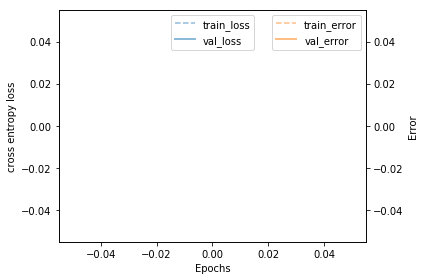

/content/One_shot_Face_recognition


In [ ]:
%cd data
#!ls -l
training_curves(experiment)
%cd ..

In [ ]:
from google.colab import auth
auth.authenticate_user()


In [ ]:
!python -m zipfile -c siamese_checkpoint_100.zip data/checkpoint

In [ ]:
!python -m zipfile -c expression.zip /content/Facial-Expression-Recognition.Pytorch/my_modelcheckpoint/exp_recognition_net.stdt

In [ ]:
!ls -l

In [ ]:
from googleapiclient.http import MediaFileUpload
from googleapiclient.discovery import build
drive_service = build('drive', 'v3')
file_metadata = {
  'name': 'expressions',
  'mimeType': 'text/plain'
}
media = MediaFileUpload('expression.zip', 
                        mimetype='text/plain',
                        resumable=True)
created = drive_service.files().create(body=file_metadata,
                                       media_body=media,
                                       fields='id').execute()
print('File ID: {}'.format(created.get('id')))

File ID: 1CjQlY4LIuChr21sXMfXEfEjXWPr6MYOR


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
!ls

cifar-100-python.tar.gz     lightCNN_48_checkpoint.pth
IIC			    lightCNN_51_checkpoint.pth
IIC_test.txt		    lightnet_features_IMFDBtrain_loss.txt
IIC_train.txt		    lightnet_features_IMFDBval_loss.txt
IIC.zip			    lightnet_finetune_fc1_fc2_IMFDBtrain_loss.txt
IMFDB-16.png		    lightnet_finetune_fc1_fc2_IMFDBval_loss.txt
IMFDB_final		    lightnet_finetune_IICtrain_loss.txt
IMFDB_test_sorted.txt	    lightnet_finetune_IICval_loss.txt
IMFDB_test.txt		    siamese_checkpoint_40.zip
IMFDB_train_sorted.txt	    siamese_IMFDB
IMFDB_train.txt		    siamese_IMFDBtrain_loss.txt
light_cnn		    siamese_IMFDBval_loss.txt
lightCNN_47_checkpoint.pth


In [ ]:
!cp /content/gdrive/My\ Drive/siamese_checkpoint_40 data/siamese_checkpoint_40.zip

In [ ]:
%cd data
!unzip siamese_checkpoint_40.zip
%cd ../

/content/One_shot_Face_recognition/data
Archive:  siamese_checkpoint_40.zip
   creating: checkpoint/
  inflating: checkpoint/siamese_ckpt.t7  
/content/One_shot_Face_recognition


In [ ]:
!cat data/siamese_IMFDB/train_loss.txt

#### Lets see how well does the siamese detect an imposter. We check whether image_2 is same individual as image_1 or an imposter. We do this by computing dissimilarity score between features.

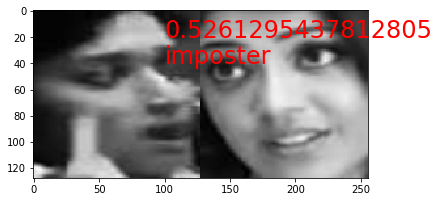

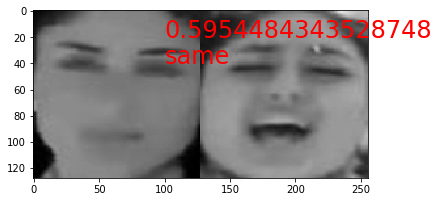

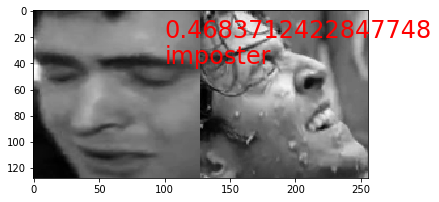

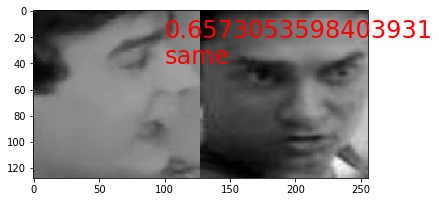

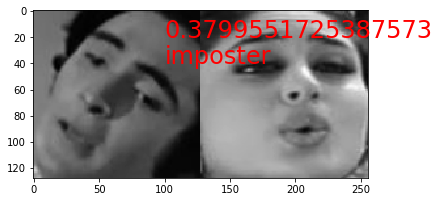

...

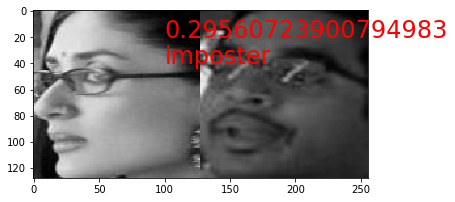

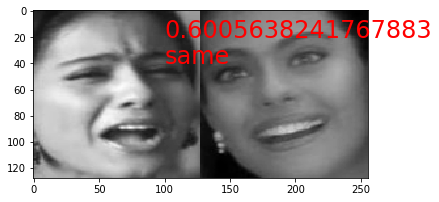

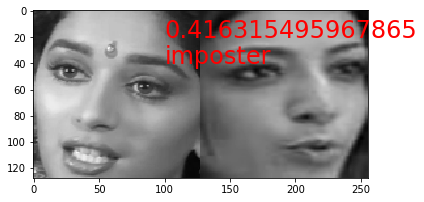

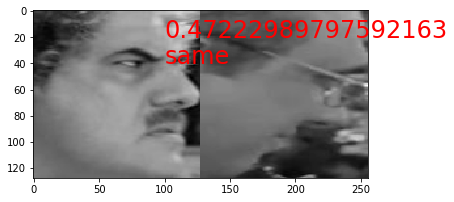

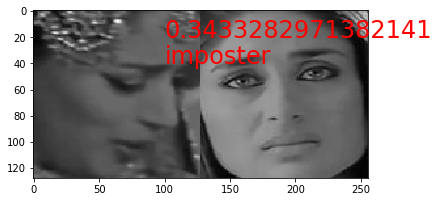

In [ ]:
testloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[128,128]), 
                                           batch_size=1, num_workers=1, shuffle = False, pin_memory=False)

lab = ['same', 'imposter']
with torch.no_grad():
  for batch_idx, (inputs_1, inputs_2, targets) in enumerate(testloader):
      if batch_idx%10 == 0 or int(targets)==0:      ### show every tenth image or if its the same individual

          inputs_1, inputs_2, targets = inputs_1.to(device), inputs_2.to(device), targets.to(device)
          optimizer.zero_grad()
          #inputs_1, inputs_2, targets = inputs_1), Variable(inputs_2), Variable(targets)
          features_1 = feature_net(inputs_1)[1]     ### get feature for image_1
          features_2 = feature_net(inputs_2)[1]      ### get feature for image_2

          dissimilarity = torch.nn.functional.cosine_similarity(features_1, features_2).item()
          img = np.concatenate((inputs_1.data.cpu().numpy()[0][0], inputs_2.data.cpu().numpy()[0][0]), axis = 1)
          plt.imshow(img, cmap='gray')
          plt.text(100,20,str(dissimilarity), fontsize=24, color='r')     ### similarity score
          plt.text(100,40,lab[int(targets.data[0])], fontsize=24, color='r')   ### ground truth
          plt.show()


### Now we use this network for feature extraction and train an MLP classifier. Feature_net is not updated/train/tweak after this. We only train the MLP classifier.

In [ ]:
classifier = nn.Sequential(nn.Dropout(p=0.5), nn.Linear(256, 64), nn.BatchNorm1d(64), nn.ReLU(),
                           nn.Dropout(p=0.2), nn.Linear(64, 32), nn.BatchNorm1d(32), nn.ReLU(),
                           nn.Dropout(p=0.2), nn.Linear(32, num_classes))
classifier =  classifier.to(device)

In [ ]:
classifier = nn.Sequential(nn.Linear(256, 64), nn.BatchNorm1d(64), nn.ReLU(),
                           nn.Linear(64, 32), nn.BatchNorm1d(32), nn.ReLU(),
                           nn.Linear(32, num_classes))
classifier =  classifier.to(device)

In [ ]:
classifier = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(),
                           nn.Dropout(p=0.2), nn.Linear(1024, 512), nn.BatchNorm1d(512), nn.ReLU(),
                           nn.Linear(512, num_classes))
classifier =  classifier.to(device)

In [ ]:


train_list_file = cf.data_dir+'IMFDB_train.txt'   #### 5000 images for training
val_list_file = cf.data_dir+'IMFDB_test.txt'      #### 1095 images for validation


train_image_list = [line.rstrip('\n') for line in open(train_list_file)]
val_image_list = [line.rstrip('\n') for line in open(val_list_file)]

print(len(train_image_list), len(val_image_list))

#Try different batch size :64
trainloader = torch.utils.data.DataLoader(custom_data_loader(img_root = img_root, image_list = train_list_file, crop=False,
                                                             resize = True, resize_shape=[128,128]), 
                                          batch_size=32, num_workers=16, shuffle = True, pin_memory=False)

testloader = torch.utils.data.DataLoader(custom_data_loader(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[128,128]), 
                                         batch_size=10, num_workers=5, shuffle = False, pin_memory=False)

5000 1095


In [ ]:
alpha = 0.5
beta = 1-alpha

def li_regularizer(net):
    
    lambda_li = 0.001
    li_reg_loss = 0
    for m in net.modules():
        if isinstance(m,nn.Linear):
            temp_loss = torch.sum(((torch.sum(((m.weight)**2),1))**0.5),0)
            li_reg_loss += lambda_li*temp_loss

    return li_reg_loss

  
def lo_regularizer(net):
    
    lambda_lo = 0.001
    lo_reg_loss = 0
    for m in net.modules():
        if isinstance(m,nn.Linear):
            temp_loss = torch.sum(((torch.sum(((m.weight)**2),0))**0.5),-1)
            lo_reg_loss += lambda_lo*temp_loss
    
    return lo_reg_loss

In [ ]:
def train_classifier(epoch):
    print('\nEpoch: %d' % epoch)
    classifier.train()
    train_loss = 0
    correct = 0
    total = 0
    for batch_idx, (inputs, targets) in enumerate(trainloader):
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        #inputs, targets = Variable(inputs), Variable(targets)
        features = feature_net(inputs)[1]
        
        outputs = classifier(features)
        size_ = outputs.size()
        outputs_ = outputs.view(size_[0], num_classes)
        loss = criterion(outputs_, targets)
        #net = classifier.parameters()
        loss = loss + alpha*li_regularizer(classifier) + beta*lo_regularizer(classifier)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        _, predicted = torch.max(outputs_.data, 1)
        total += targets.size(0)
        correct += predicted.eq(targets.data).cpu().sum()
        
        progress_bar(batch_idx, len(trainloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                         % (train_loss/(batch_idx+1), 100.*correct/total, correct, total))
        if(batch_idx % 100 == 0):
          print('Loss: %.3f '% (train_loss/(batch_idx+1)))
        
    train_loss_file.write('%d %.3f %.3f\n' %(epoch, train_loss/len(trainloader), 100.*correct/total))
    


In [ ]:
def test_classifier(epoch):
    global best_acc
    classifier.eval()
    test_loss = 0
    correct = 0
    total = 0
    for batch_idx, (inputs, targets) in enumerate(testloader):
        #if device:
        inputs, targets = inputs.to(device), targets.to(device)
        #inputs, targets = Variable(inputs, volatile=True), Variable(targets)
        features = feature_net(inputs)[1]      
        
        outputs = classifier(features)
        size_ = outputs.size()
        outputs_ = outputs.view(size_[0], num_classes)
        loss = criterion(outputs_, targets)

        test_loss += loss.item()
        _, predicted = torch.max(outputs_.data, 1)
        total += targets.size(0)
        correct += predicted.eq(targets.data).cpu().sum()
        
        progress_bar(batch_idx, len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                         % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))
        
    val_loss_file.write('%d %.3f %.3f\n' %(epoch,  test_loss/len(testloader), 100.*correct/total))

    # Save checkpoint.
    acc = 100.*correct/total
    if acc > best_acc:
        print('Saving..')
        state = {
            'net': classifier,
            'acc': acc,
            'epoch': epoch,
        }
        if not os.path.isdir(cf.data_dir+'checkpoint'):
            os.mkdir(cf.data_dir+'checkpoint')
        torch.save(state, cf.data_dir+'checkpoint/checkpoint_ckpt.t7')
        best_acc = acc
    
    return test_loss/len(testloader)

In [ ]:
best_acc = 0
experiment2 = 'classify_IMFDB'
train_loss_file = open(cf.data_dir+experiment2+"train_loss.txt", "w")
val_loss_file = open(cf.data_dir+experiment2+"val_loss.txt", "w")

In [ ]:
classifier

Sequential(
  (0): Dropout(p=0.5)
  (1): Linear(in_features=8192, out_features=256, bias=True)
  (2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): ReLU()
  (4): Dropout(p=0.2)
  (5): Linear(in_features=256, out_features=32, bias=True)
  (6): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): ReLU()
  (8): Linear(in_features=32, out_features=16, bias=True)
)

In [ ]:
if epoch == 10:
    optimizer = optim.Adam(classifier.parameters(), lr=0.005)
  if epoch == 15:
    optimizer = optim.Adam(classifier.parameters(), lr=0.0001)

In [ ]:
train_loss_file.close()
val_loss_file.close()

In [ ]:
#%%capture
optimizer = optim.Adam(classifier.parameters(), lr=0.001)
feature_net = feature_net.to(device)
#scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma= 0.1)#try 0.5 gaama faster
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=2, verbose=True)   #### dynamic LR scheduler
for epoch in range(0, 30):
  train_classifier(epoch)
  test_loss = test_classifier(epoch)
  scheduler.step(test_loss)
  print("Test Loss: ", test_loss)
    
train_loss_file.close()
val_loss_file.close()


Epoch: 0
Loss: 3.565 
Loss: 3.423 
 [==================================>] | Loss: 3.369 | Acc: 18.000% (901/5000)   157/157 
 [==================================>] | Loss: 2.452 | Acc: 21.000% (234/1095)   110/110 
Saving..
Test Loss:  2.4524327202276752

Epoch: 1
Loss: 2.993 
Loss: 3.027 
 [==================================>] | Loss: 3.020 | Acc: 28.000% (1429/5000)  157/157 
 [==================================>] | Loss: 2.378 | Acc: 22.000% (247/1095)   110/110 
Saving..
Test Loss:  2.3781334400177

Epoch: 2
Loss: 2.872 
Loss: 2.862 
 [==================================>] | Loss: 2.893 | Acc: 33.000% (1660/5000)  157/157 
 [==================================>] |

KeyboardInterrupt: ignored

In [ ]:
classify = torch.load(cf.data_dir+'checkpoint/checkpoint_ckpt.t7')['net'].eval()

In [ ]:
feature_net

network_9layers(
  (features): Sequential(
    (0): mfm(
      (filter): Conv2d(1, 96, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    )
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (2): group(
      (conv_a): mfm(
        (filter): Conv2d(48, 96, kernel_size=(1, 1), stride=(1, 1))
      )
      (conv): mfm(
        (filter): Conv2d(48, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (4): group(
      (conv_a): mfm(
        (filter): Conv2d(96, 192, kernel_size=(1, 1), stride=(1, 1))
      )
      (conv): mfm(
        (filter): Conv2d(96, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (6): group(
      (conv_a): mfm(
        (filter): Conv2d(192, 384, kernel_size=(1, 1), stride=(1, 1))
      )
      (conv): mfm(
        (f

In [ ]:
def eval():
    feature_net.eval()
    classifier.eval()
    
    testloader = torch.utils.data.DataLoader(custom_data_loader(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[128,128]), 
                                           batch_size=1, num_workers=1, shuffle = False, pin_memory=False)
    correct = 0
    total = 0
    conf_mat = np.zeros((num_classes, num_classes))
    total_ = 1e-12+np.zeros((num_classes))
    wrong_predictions = []
    for batch_idx, (inputs, targets) in enumerate(testloader):
        #if use_cuda:
        inputs, targets = inputs.to(device), targets.to(device)
        #inputs, targets = Variable(inputs, volatile=True), Variable(targets)
        features = feature_net.features(inputs).detach()
        #features = feature_net(inputs)[1]
        #print(features.shape)
        features = features.view(1,-1)
        #print(features.shape)
        #print(features.size())        
        outputs = classifier(features)
        #outputs = classify(features)
        size_ = outputs.size()
        outputs_ = outputs.view(size_[0], num_classes)
        _, predicted = torch.max(outputs_.data, 1)
        total += targets.size(0)
        correct += predicted.eq(targets.data).cpu().sum()
        prediction = predicted.cpu().numpy()[0]
        targets = targets.data.cpu().numpy()[0]
        total_[targets] +=1
        conf_mat[predicted, targets] +=1
        
        if prediction != targets:
            wrong_predictions += [[inputs, prediction, targets]]
        
    #for k in range(num_classes):
    #    conf_mat[:,k] /= total_[k]
    print('total = ', total)
    return conf_mat, 100.*correct/total, wrong_predictions
    

In [ ]:
#classifier = nn.Sequential(nn.Linear(8192, 64), nn.BatchNorm1d(64), nn.ReLU(),
#                           nn.Linear(64, 32), nn.BatchNorm1d(32), nn.ReLU(),
#                           nn.Linear(32, num_classes))
#classifier = classifier.to(device)

In [ ]:
#%%capture
conf, acc, wrong_predictions = eval()

total =  1095


**Plot of Confusion Matrix**

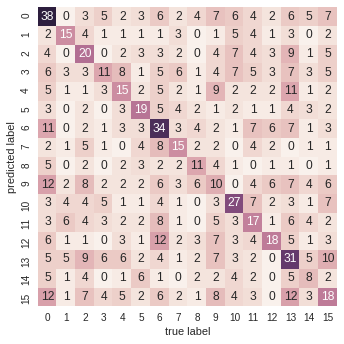

In [ ]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt


conf = conf.astype(int)
sns.heatmap(conf.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

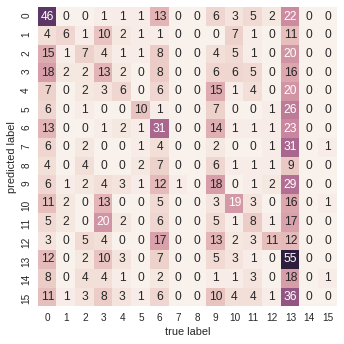

In [ ]:
#only dropout - 30 epoch
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt


conf = conf.astype(int)
sns.heatmap(conf.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

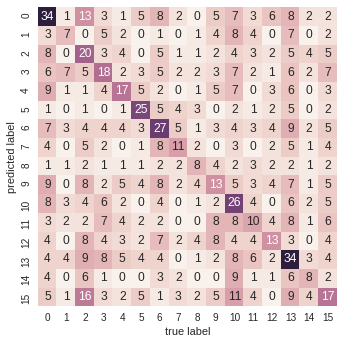

In [ ]:
#no dropouts

import seaborn as sns; sns.set()
import matplotlib.pyplot as plt


conf = conf.astype(int)
sns.heatmap(conf.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

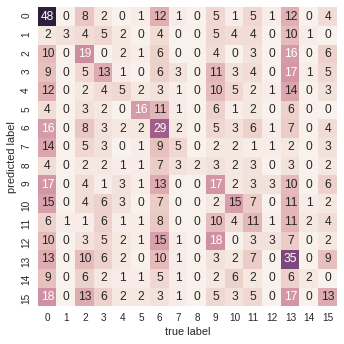

In [ ]:
#only 1 layer
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt


conf = conf.astype(int)
sns.heatmap(conf.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
print(acc)
len(wrong_predictions)/1095

tensor(26)


0.736986301369863

/content/One_shot_Face_recognition/data
30 30


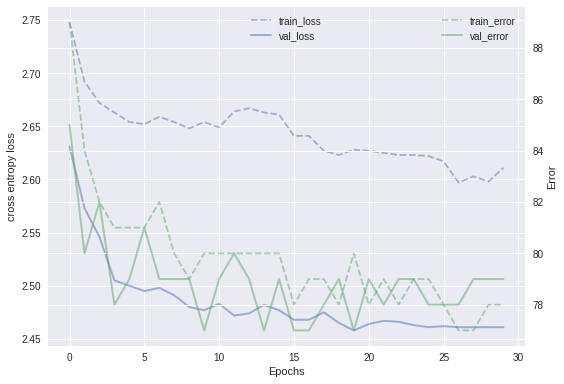

/content/One_shot_Face_recognition


In [ ]:
%cd data
#!ls -l
training_curves(experiment2)
%cd ..

In [ ]:
%cd data
#!ls -l
training_curves(experiment2)
%cd ..

[Errno 2] No such file or directory: 'data'
/content


NameError: ignored

In [ ]:
len(wrong_predictions[0])

3

KajalAgarwal confused with Rimisen


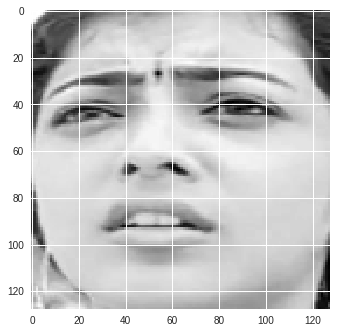

AnilKapoor confused with KatrinaKaif


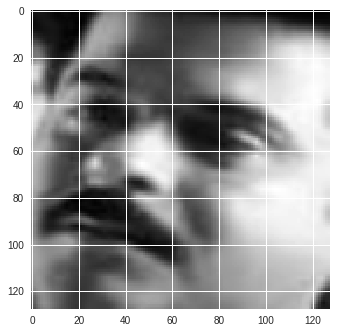

Trisha confused with KareenaKapoor


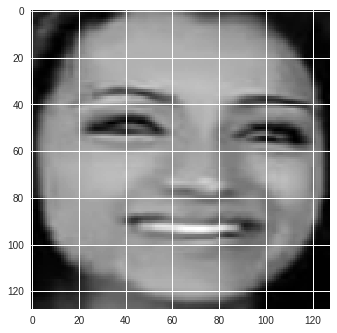

Umashri confused with AamairKhan


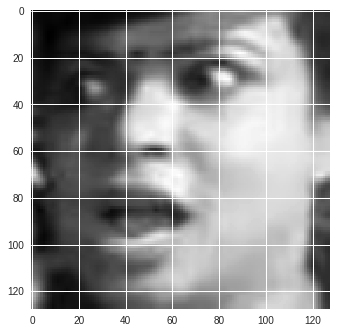

KareenaKapoor confused with MadhuriDixit


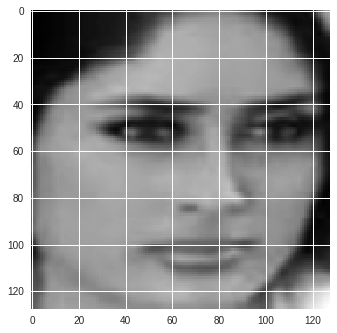

AmrishPuri confused with MadhuriDixit


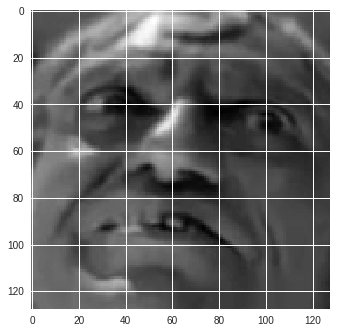

AamairKhan confused with AnupamKher


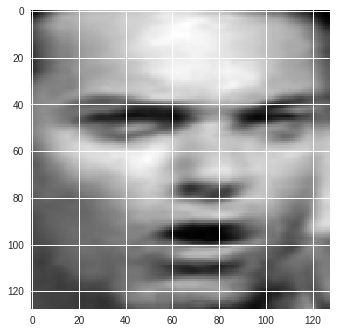

MadhuriDixit confused with KatrinaKaif


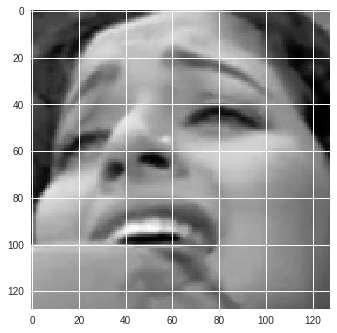

MadhuriDixit confused with Kajol


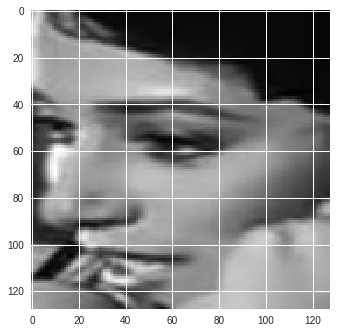

MadhuriDixit confused with Rimisen


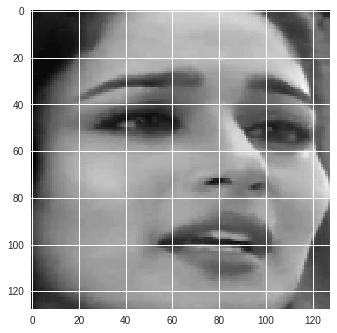

KareenaKapoor confused with AmrishPuri


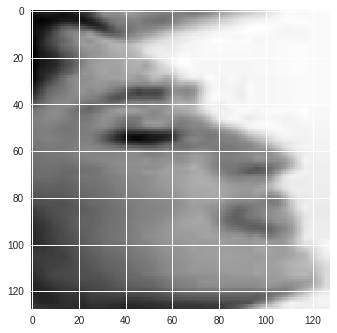

MadhuriDixit confused with KajalAgarwal


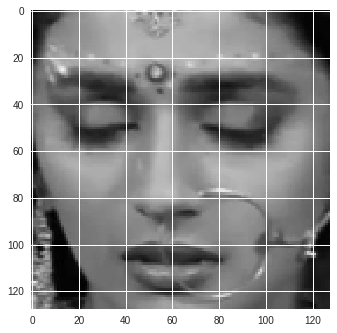

Rimisen confused with RishiKapoor


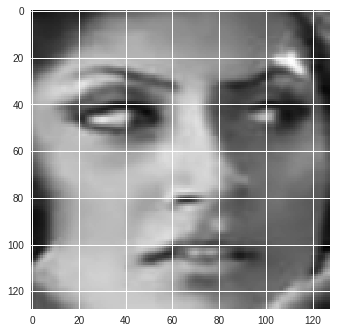

KatrinaKaif confused with AnupamKher


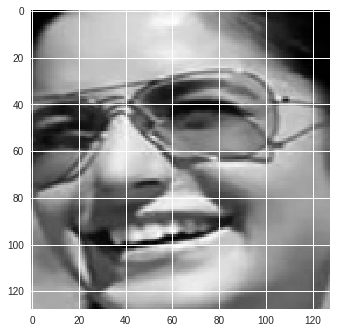

AnilKapoor confused with HrithikRoshan


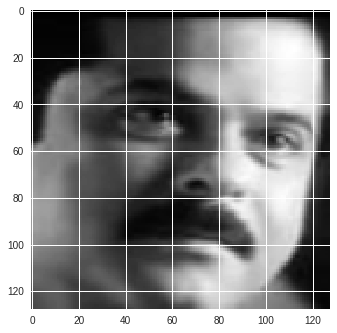

RishiKapoor confused with MadhuriDixit


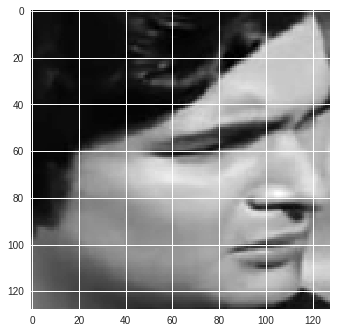

RishiKapoor confused with KajalAgarwal


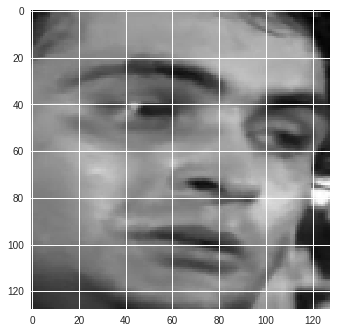

AamairKhan confused with MadhuriDixit


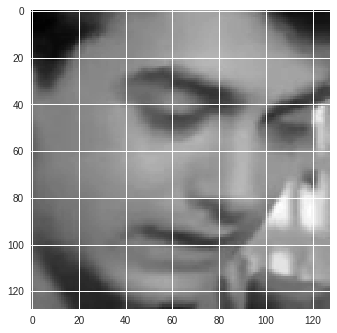

AnilKapoor confused with Umashri


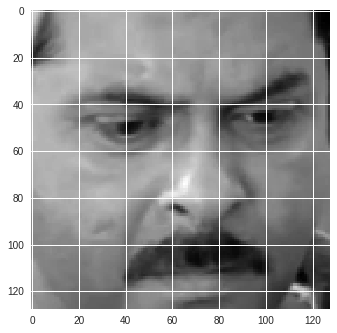

Umashri confused with AnilKapoor


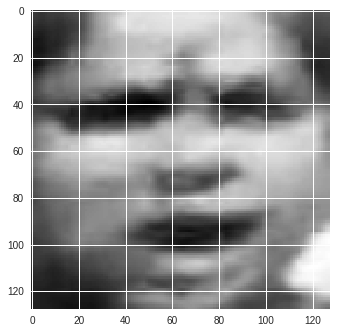

Trisha confused with RishiKapoor


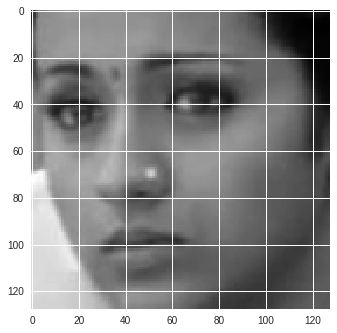

AnilKapoor confused with Madhavan


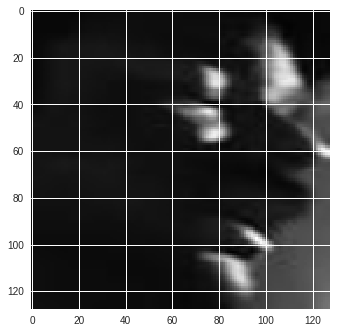

Trisha confused with AamairKhan


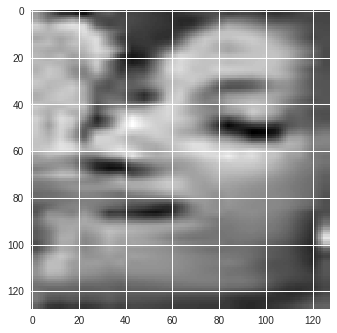

HrithikRoshan confused with AamairKhan


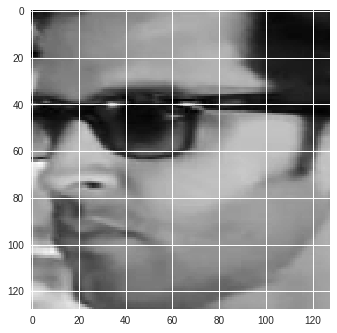

Kajol confused with AamairKhan


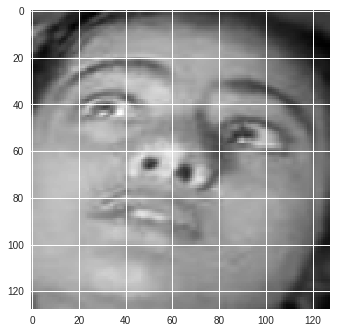

KareenaKapoor confused with KajalAgarwal


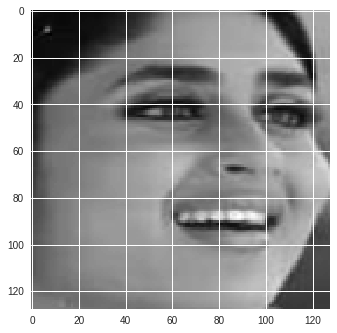

KareenaKapoor confused with KatrinaKaif


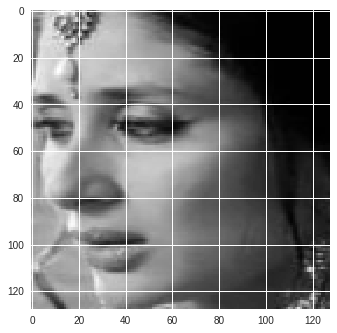

Madhavan confused with HrithikRoshan


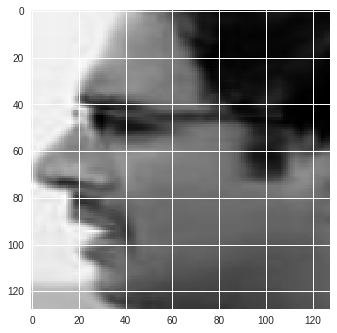

KajalAgarwal confused with AamairKhan


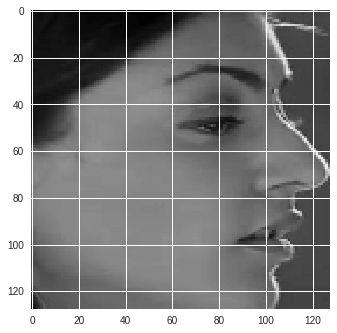

Madhavan confused with AnilKapoor


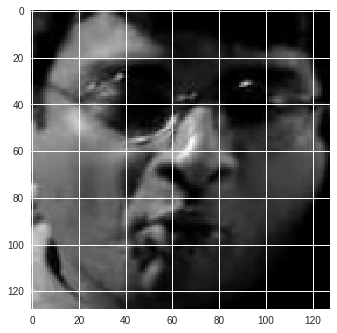

KajalAgarwal confused with RishiKapoor


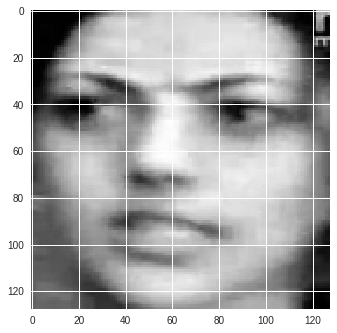

Madhavan confused with HrithikRoshan


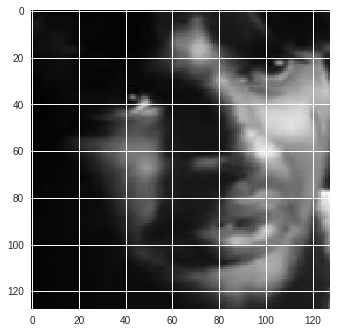

Umashri confused with Madhavan


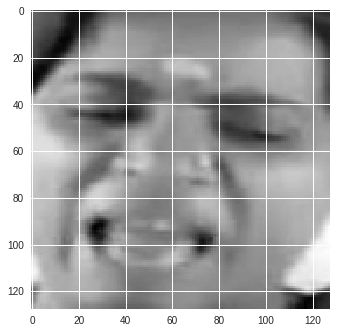

AnupamKher confused with Madhavan


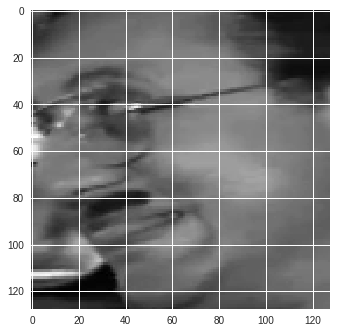

BomanIrani confused with HrithikRoshan


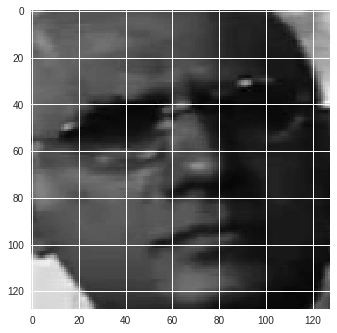

Rimisen confused with AnilKapoor


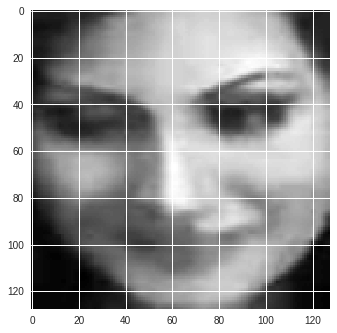

HrithikRoshan confused with AamairKhan


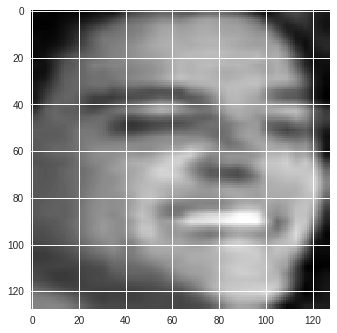

MadhuriDixit confused with KareenaKapoor


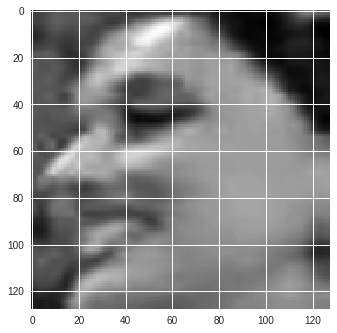

Umashri confused with KatrinaKaif


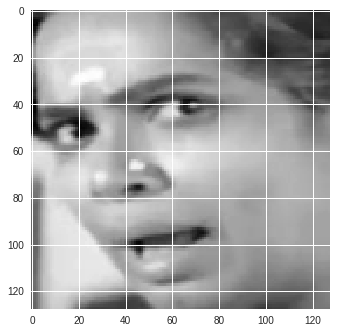

AamairKhan confused with AmrishPuri


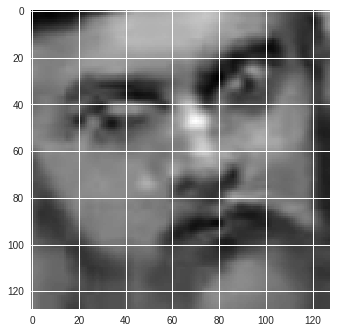

HrithikRoshan confused with Madhavan


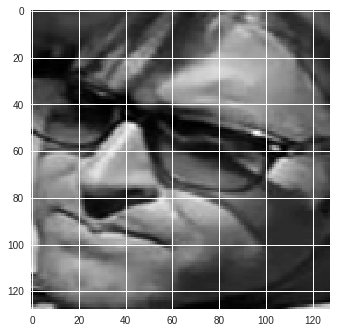

AnilKapoor confused with AmrishPuri


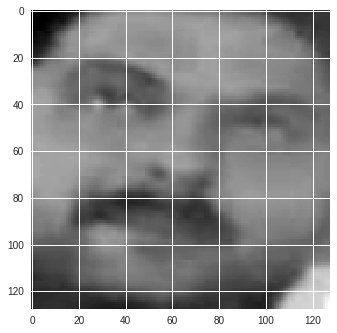

HrithikRoshan confused with MadhuriDixit


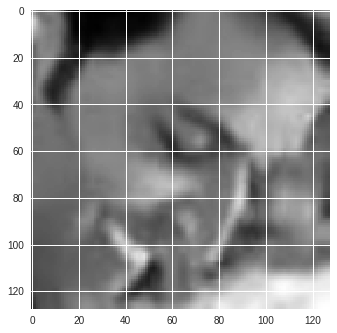

Madhavan confused with AamairKhan


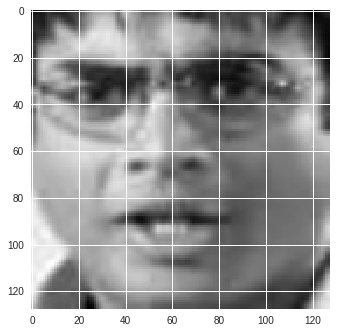

KareenaKapoor confused with AamairKhan


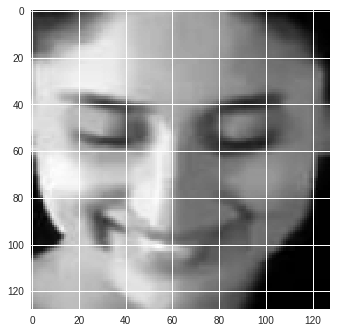

KajalAgarwal confused with AamairKhan


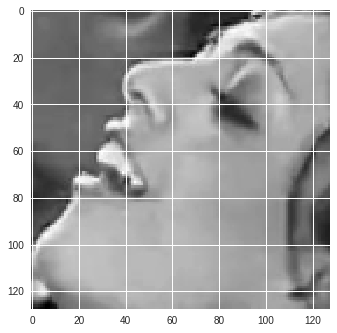

RishiKapoor confused with AnupamKher


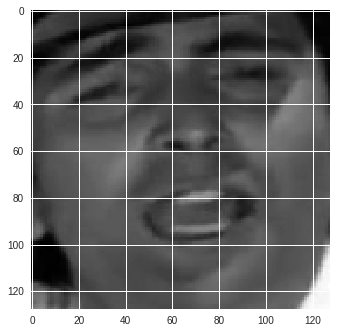

AamairKhan confused with Kajol


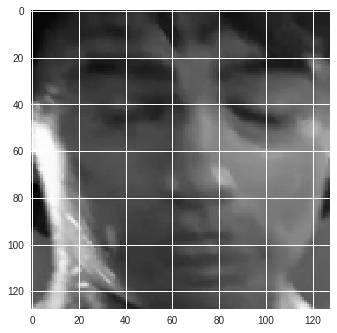

MadhuriDixit confused with KajalAgarwal


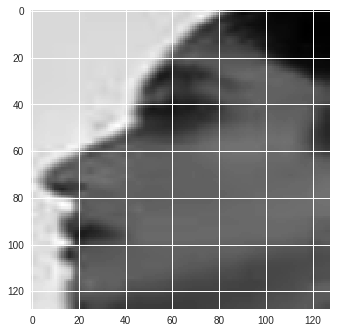

Trisha confused with Kajol


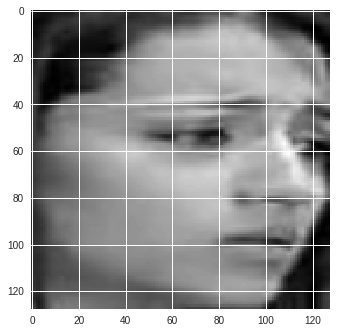

Kajol confused with KareenaKapoor


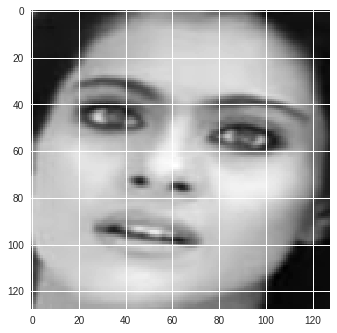

HrithikRoshan confused with Madhavan


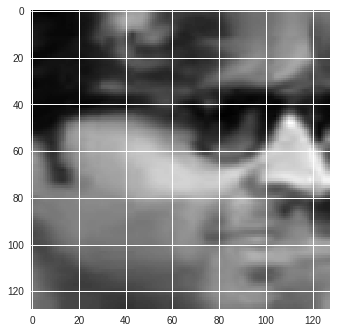

Rimisen confused with HrithikRoshan


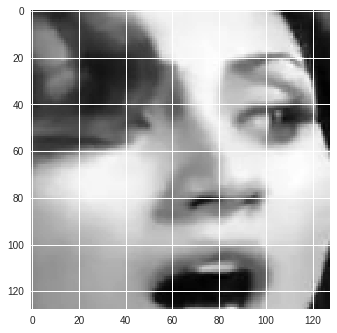

KareenaKapoor confused with KajalAgarwal


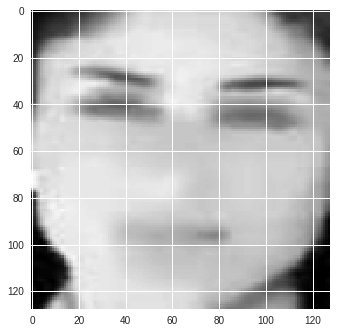

MadhuriDixit confused with Kajol


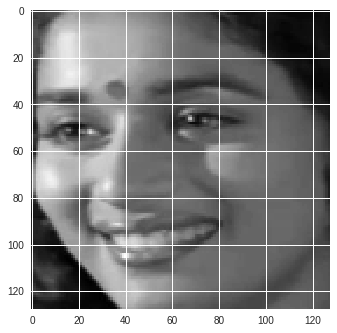

Kajol confused with Trisha


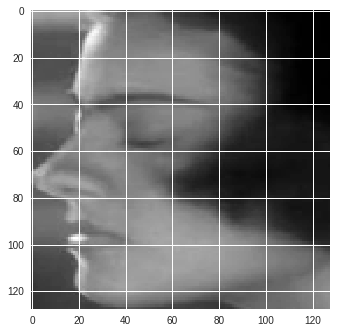

RishiKapoor confused with AamairKhan


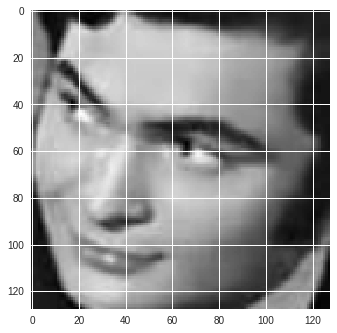

AnilKapoor confused with AamairKhan


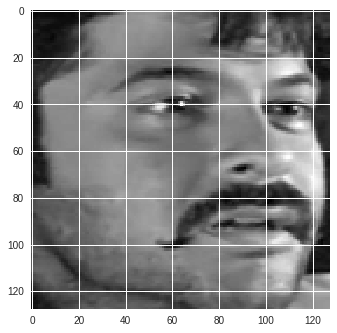

RishiKapoor confused with Umashri


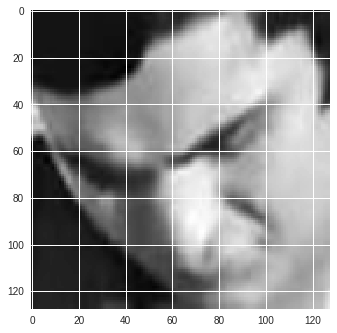

AnupamKher confused with MadhuriDixit


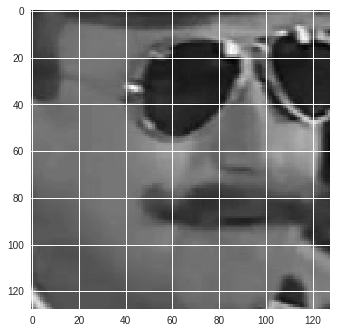

Madhavan confused with HrithikRoshan


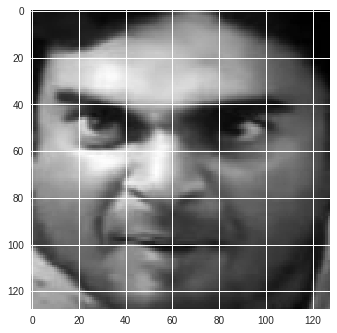

KajalAgarwal confused with Kajol


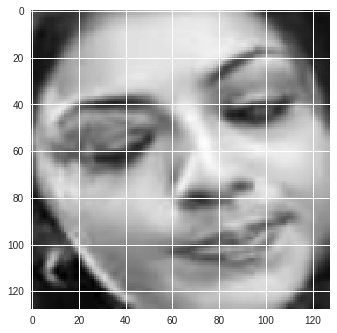

RishiKapoor confused with Rimisen


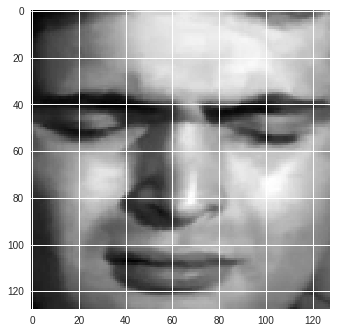

Kajol confused with AnilKapoor


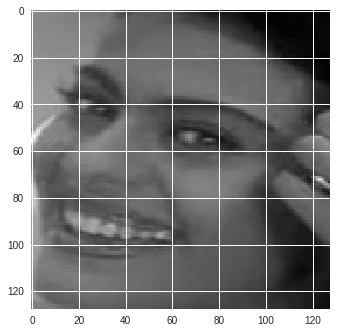

Trisha confused with AamairKhan


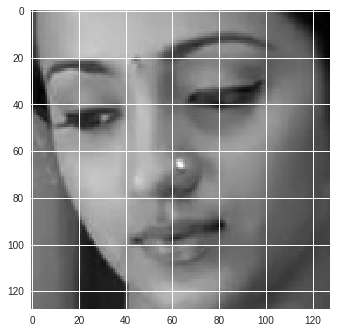

BomanIrani confused with AmrishPuri


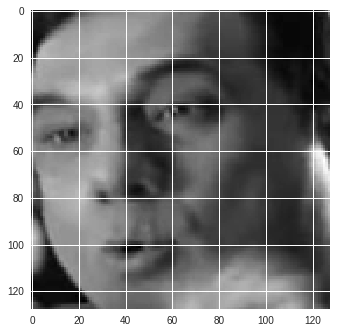

AnupamKher confused with Rimisen


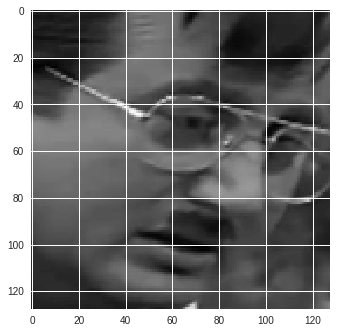

MadhuriDixit confused with RishiKapoor


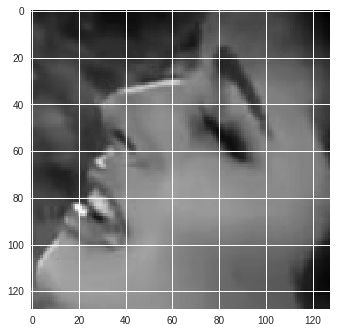

In [ ]:
for w in wrong_predictions[::10]:
    print(classes[w[2]], 'confused with', classes[w[1]])
    plt.imshow(w[0][0][0].data.cpu().numpy(), cmap='gray')
    plt.show()

### Please answer the questions below to complete the experiment:

In [ ]:
#@title How was the experiment? { run: "auto", form-width: "500px", display-mode: "form" }
Complexity = "Good and Challenging me" #@param ["Too Simple, I am wasting time", "Good, But Not Challenging for me", "Good and Challenging me", "Was Tough, but I did it", "Too Difficult for me"]


In [ ]:
#@title If it was very easy, what more you would have liked to have been added? If it was very difficult, what would you have liked to have been removed? { run: "auto", display-mode: "form" }
Additional = "none" #@param {type:"string"}

In [ ]:
#@title Can you identify the concepts from the lecture which this experiment covered? { run: "auto", vertical-output: true, display-mode: "form" }
Concepts = "Yes" #@param ["Yes", "No"]

In [ ]:
#@title Run this cell to submit your notebook for grading { vertical-output: true }
try:
  if submission_id:
      return_id = submit_notebook()
      if return_id : submission_id =return_id
  else:
      print("Please complete the setup first.")
except NameError:
  print ("Please complete the setup first.")

Your submission is successful.
Ref Id: 10928
Date of submission:  16 Feb 2019
Time of submission:  10:31:56
View your submissions: https://iiith-aiml.talentsprint.com/notebook_submissions
For any queries/discrepancies, please connect with mentors through the chat icon in LMS dashboard.
